Swiggy Sales Analysis

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
df = pd.read_excel("swiggy_data.xlsx")

In [ ]:
df.head(10)

,State,City,Order Date,Restaurant Name,Location,Category,Dish Name,Price (INR),Rating,Rating Count
0,Karnataka,Bengaluru,2025-06-29,Anand Sweets & Savouries,Rajarajeshwari Nagar,Snack,Butter Murukku-200gm,133.9,4.0,0
1,Karnataka,Bengaluru,2025-04-03,Srinidhi Sagar Deluxe,Kengeri,Recommended,Badam Milk,52.0,4.5,25
2,Karnataka,Bengaluru,2025-01-15,Srinidhi Sagar Deluxe,Kengeri,Recommended,Chow Chow Bath,117.0,4.7,48
3,Karnataka,Bengaluru,2025-04-17,Srinidhi Sagar Deluxe,Kengeri,Recommended,Kesari Bath,65.0,4.6,65
4,Karnataka,Bengaluru,2025-03-13,Srinidhi Sagar Deluxe,Kengeri,Recommended,Mix Raitha,130.0,4.0,0
5,Karnataka,Bengaluru,2025-07-08,Srinidhi Sagar Deluxe,Kengeri,Recommended,Srinidhi Sagar Special,312.0,4.0,0
6,Karnataka,Bengaluru,2025-01-21,Srinidhi Sagar Deluxe,Kengeri,Recommended,Garlic Naan,98.0,4.0,34
7,Karnataka,Bengaluru,2025-04-13,Srinidhi Sagar Deluxe,Kengeri,Recommended,Pista,137.0,4.0,0
8,Karnataka,Bengaluru,2025-05-02,Srinidhi Sagar Deluxe,Kengeri,North Indian Gravy,Panneer Butter Masala,241.0,4.4,29
9,Karnataka,Bengaluru,2025-07-30,Srinidhi Sagar Deluxe,Kengeri,North Indian Gravy,Dal Tadka,195.0,4.9,51


In [ ]:
df.tail()

,State,City,Order Date,Restaurant Name,Location,Category,Dish Name,Price (INR),Rating,Rating Count
197425,Sikkim,Gangtok,2025-01-25,Mama's Kitchen,Gangtok,Momos,Soya cheese chilli momo ...,112.0,4.4,0
197426,Sikkim,Gangtok,2025-07-02,Mama's Kitchen,Gangtok,Momos,Kurkure momo fried ...,140.0,4.4,0
197427,Sikkim,Gangtok,2025-03-25,Mama's Kitchen,Gangtok,Momos,Chilli cheese momo,126.0,4.4,0
197428,Sikkim,Gangtok,2025-03-26,Mama's Kitchen,Gangtok,Momos,Veg Momos (8 Pc),85.0,4.4,0
197429,Sikkim,Gangtok,2025-03-27,Mama's Kitchen,Gangtok,Momos,Soya Momo,100.0,4.4,0


In [ ]:
print("no of rows : " ,df.shape[0])

no of rows :  197430


In [ ]:
print("no of colunms : " ,df.shape[1])

no of colunms :  10


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197430 entries, 0 to 197429
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   State            197430 non-null  object        
 1   City             197430 non-null  object        
 2   Order Date       197430 non-null  datetime64[ns]
 3   Restaurant Name  197430 non-null  object        
 4   Location         197430 non-null  object        
 5   Category         197430 non-null  object        
 6   Dish Name        197430 non-null  object        
 7   Price (INR)      197430 non-null  float64       
 8   Rating           197430 non-null  float64       
 9   Rating Count     197430 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(6)
memory usage: 15.1+ MB


In [ ]:
df.dtypes

,0
State,object
City,object
Order Date,datetime64[ns]
Restaurant Name,object
Location,object
Category,object
Dish Name,object
Price (INR),float64
Rating,float64
Rating Count,int64


In [ ]:
df.describe()

,Order Date,Price (INR),Rating,Rating Count
count,197430,197430.000000,197430.000000,197430.000000
mean,2025-05-01 19:41:20.996808960,268.512920,4.341582,28.321805
min,2025-01-01 00:00:00,0.950000,1.500000,0.000000
25%,2025-03-01 00:00:00,139.000000,4.300000,0.000000
50%,2025-05-02 00:00:00,229.000000,4.400000,2.000000
75%,2025-07-01 00:00:00,329.000000,4.500000,15.000000
max,2025-08-31 00:00:00,8000.000000,5.000000,999.000000
std,NaN,219.338363,0.422585,87.542593


KPI's

Total Sales

In [ ]:
print(df.columns)

Index(['State', 'City', 'Order Date', 'Restaurant Name', 'Location',
       'Category', 'Dish Name', 'Price (INR)', 'Rating', 'Rating Count'],
      dtype='object')


In [ ]:
total_sales = df["Price (INR)"].sum()
print("Total Sales (INR):", round(total_sales,2))

Total Sales (INR): 53012505.77


Average Rating

In [ ]:
average_rating = df["Rating"].mean()
print("Average Rating:", round(average_rating,2))

Average Rating: 4.34


Average Order Value

In [ ]:
avg_order_value = df["Price (INR)"].mean()
print("Average Order Value (INR):", round(avg_order_value,2))

Average Order Value (INR): 268.51


Ratings Counts

In [ ]:
ratings_count = df["Price (INR)"].sum()
print("Ratings Count:", round(ratings_count,2))

Ratings Count: 53012505.77


Total Orders

In [ ]:
total_orders = df["Order Date"].count()
print("Total_orders:", round(total_orders,2))

Total_orders: 197430


# CHARTS DESIGNS

Monthly Sales Trend

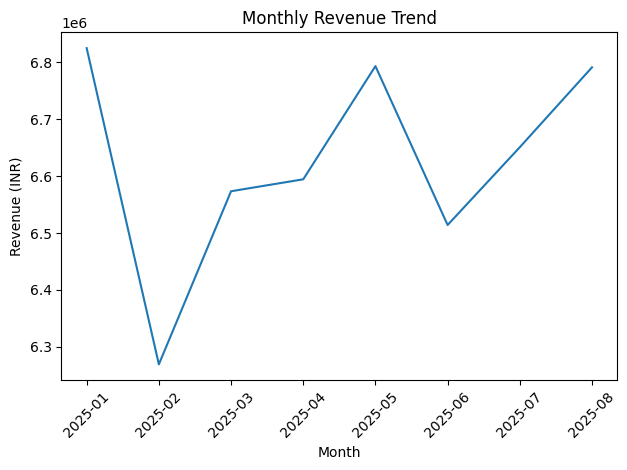

In [ ]:
# Convert Order Date column to datetime
df["Order Date"] = pd.to_datetime(df["Order Date"])

# Create YearMonth column
df["YearMonth"] = df["Order Date"].dt.to_period("M").astype(str)

# Calculate monthly revenue
monthly_revenue = df.groupby("YearMonth")["Price (INR)"].sum().reset_index()

# Plot monthly revenue trend
plt.figure()

plt.plot(monthly_revenue["YearMonth"], monthly_revenue["Price (INR)"])

plt.xticks(rotation=45)
plt.xlabel("Month")
plt.ylabel("Revenue (INR)")
plt.title("Monthly Revenue Trend")

plt.tight_layout()
plt.show()

Daily sales Trend

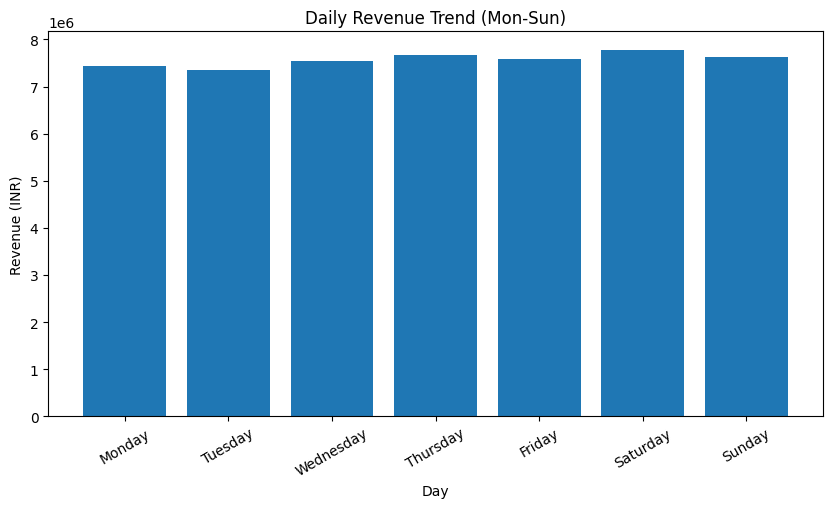

In [ ]:
# Create day name from Order Date
df["DayName"] = pd.to_datetime(df["Order Date"]).dt.day_name()

# Calculate daily revenue
daily_revenue = (
    df.groupby("DayName")["Price (INR)"]
    .sum()
    .reindex(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
)

# Plot chart
plt.figure(figsize=(10,5))

plt.bar(daily_revenue.index, daily_revenue.values)

plt.title("Daily Revenue Trend (Mon-Sun)")
plt.xlabel("Day")
plt.ylabel("Revenue (INR)")

plt.xticks(rotation=30)

plt.show()

Total Sales by Food Type (Veg vs Non-Veg)

In [ ]:
# Non-veg keywords list
non_veg_keywords = [
    "chicken", "egg", "fish", "mutton",
    "prawn", "biryani", "kabab", "kebab",
    "non-veg", "non veg"
]

# Create Food Category column (Veg / Non-Veg)
df["Food Category"] = np.where(
    df["Dish Name"].str.lower().str.contains("|".join(non_veg_keywords), na=False),
    "Non-Veg",
    "Veg"
)

In [ ]:
# Calculate revenue by food category
food_revenue = (
    df.groupby("Food Category")["Price (INR)"]
    .sum()
    .reset_index()
)

# Create pie chart
fig = px.pie(
    food_revenue,
    values="Price (INR)",
    names="Food Category",
    hole=0.5,
    title="Revenue Contribution: Veg vs Non-Veg",
)

# Update labels and pull effect
fig.update_traces(
    textinfo="percent+label",
    pull=[0.05, 0]
)

# Adjust layout
fig.update_layout(
    height=500,
    margin=dict(t=60, b=40, l=40, r=40)
)

fig.show()

Total Sales by State

In [ ]:
fig = px.bar(
    df.groupby("State", as_index=False)["Price (INR)"].sum()
      .sort_values("Price (INR)", ascending=False),
    x="Price (INR)",
    y="State",
    orientation="h",
    title="Revenue by State (INR)"
)

fig.update_layout(
    height=600,
    yaxis=dict(autorange="reversed")
)

fig.show()

Quarterly Performance Summary

In [ ]:
# Convert Order Date to datetime
df["Order_Date"] = pd.to_datetime(df["Order Date"])

# Create Quarter column
df["Quarter"] = df["Order_Date"].dt.to_period("Q").astype(str)

# Quarterly summary
quarterly_summary = (
    df.groupby("Quarter", as_index=False)
    .agg(
        Total_Sales=("Price (INR)", "sum"),
        Avg_Rating=("Rating", "mean"),
        Total_Orders=("Order_Date", "count")
    )
    .sort_values("Quarter")
)

# Round values
quarterly_summary["Total_Sales"] = quarterly_summary["Total_Sales"].round(0)
quarterly_summary["Avg_Rating"] = quarterly_summary["Avg_Rating"].round(2)

quarterly_summary

,Quarter,Total_Sales,Avg_Rating,Total_Orders
0,2025Q1,19667822.0,4.34,73096
1,2025Q2,19902257.0,4.34,74163
2,2025Q3,13442427.0,4.34,50171


Top 5 Cities by Sales

In [ ]:
# Top 5 cities by sales
top_5_cities = (
    df.groupby("City")["Price (INR)"]
    .sum()
    .nlargest(5)
    .sort_values()
    .reset_index()
)

# Create bar chart
fig = px.bar(
    top_5_cities,
    x="Price (INR)",
    y="City",
    orientation="h",
    title="Top 5 Cities by Sales (INR)",
    color_discrete_sequence=["red"]
)

fig.show()

Weekly Trend Analysis

In [ ]:
# Create Week column from Order Date
df["Week"] = pd.to_datetime(df["Order Date"]).dt.to_period("W").astype(str)

# Calculate weekly revenue
weekly_sales = (
    df.groupby("Week")["Price (INR)"]
    .sum()
    .reset_index()
)

# Plot weekly trend using Plotly
fig = px.line(
    weekly_sales,
    x="Week",
    y="Price (INR)",
    title="Weekly Sales Trend",
    markers=True
)

fig.update_layout(
    xaxis_title="Week",
    yaxis_title="Revenue (INR)",
    height=500
)

fig.show()

In [ ]:
# Create Day Name
df["DayName"] = pd.to_datetime(df["Order Date"]).dt.day_name()

# Classify Weekday vs Weekend
df["Day_Type"] = df["DayName"].apply(
    lambda x: "Weekend" if x in ["Saturday", "Sunday"] else "Weekday"
)

# Revenue by Day Type
weekly_type_sales = (
    df.groupby("Day_Type")["Price (INR)"]
    .sum()
    .reset_index()
)

# Plot interactive bar chart
fig = px.bar(
    weekly_type_sales,
    x="Day_Type",
    y="Price (INR)",
    color="Day_Type",
    title="Weekday vs Weekend Sales Comparison",
    text_auto=True
)

fig.update_layout(
    xaxis_title="Day Type",
    yaxis_title="Revenue (INR)",
    height=500
)

fig.show()

Rating vs Price Analysis

In [ ]:
fig = px.scatter(
    df,
    x="Price (INR)",
    y="Rating",
    color="Category",
    size="Rating Count",
    hover_data=["Restaurant Name","Dish Name"],
    title="Price vs Rating Analysis"
)

fig.update_layout(height=500)
fig.show()

Top 10 Restaurants by Revenue

In [ ]:
top_restaurants = (
    df.groupby("Restaurant Name")["Price (INR)"]
    .sum()
    .nlargest(10)
    .reset_index()
)

fig = px.bar(
    top_restaurants,
    x="Price (INR)",
    y="Restaurant Name",
    orientation="h",
    title="Top 10 Restaurants by Revenue"
)

fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

Category Sales Distribution

In [ ]:
category_sales = (
    df.groupby("Category")["Price (INR)"]
    .sum()
    .reset_index()
)

fig = px.pie(
    category_sales,
    values="Price (INR)",
    names="Category",
    title="Sales Distribution by Food Category"
)

fig.show()

Rating Distribution

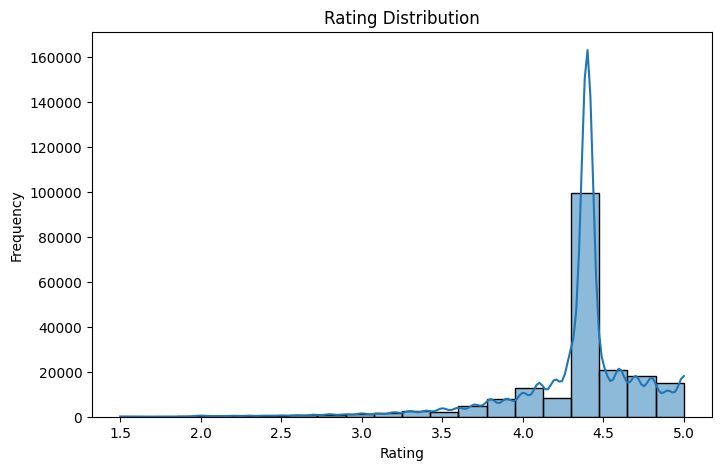

In [ ]:
plt.figure(figsize=(8,5))

sns.histplot(df["Rating"], bins=20, kde=True)

plt.title("Rating Distribution")
plt.xlabel("Rating")
plt.ylabel("Frequency")

plt.show()

City vs Category Heatmap

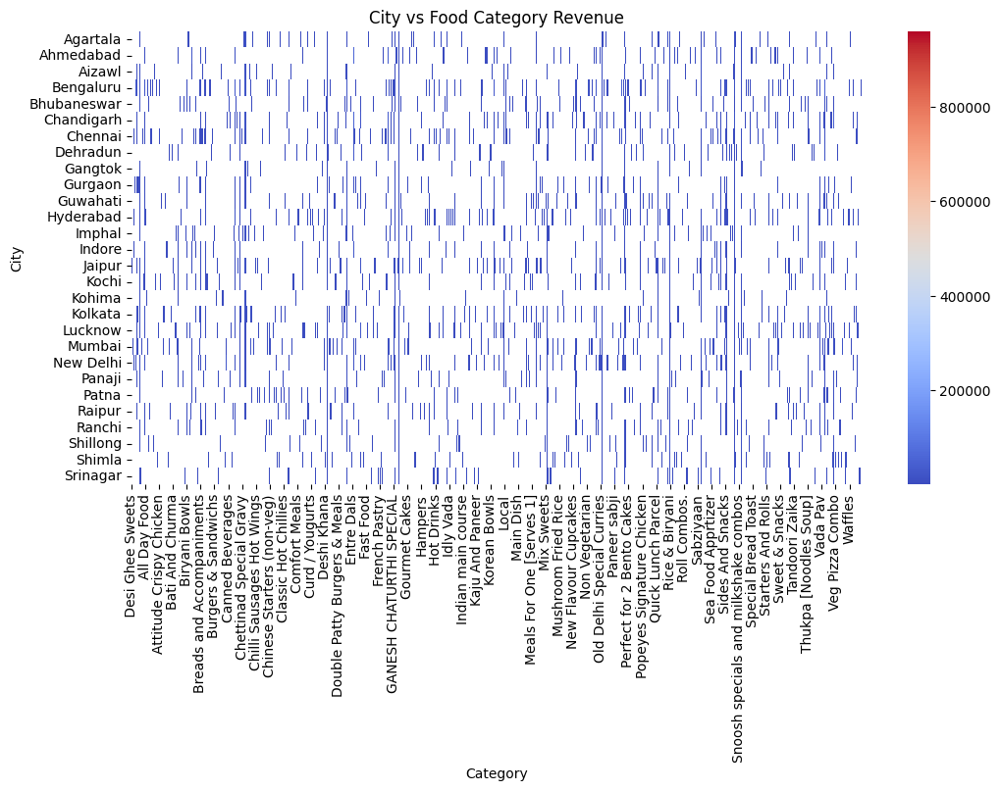

In [ ]:
pivot_table = pd.pivot_table(
    df,
    values="Price (INR)",
    index="City",
    columns="Category",
    aggfunc="sum"
)

plt.figure(figsize=(12,6))

sns.heatmap(pivot_table, cmap="coolwarm")

plt.title("City vs Food Category Revenue")

plt.show()

Top 10 Most Ordered Dishes

In [ ]:
top_dishes = (
    df.groupby("Dish Name")["Rating Count"]
    .sum()
    .nlargest(10)
    .reset_index()
)

fig = px.bar(
    top_dishes,
    x="Rating Count",
    y="Dish Name",
    orientation="h",
    title="Top 10 Most Popular Dishes"
)

fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()